<a href="https://colab.research.google.com/github/alisha-q/leukemia-detection-labs/blob/main/5_3_OpenCV_Complete_Notes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📝 OpenCV Python - Complete Notes

**Comprehensive guide covering OpenCV basics for image and video handling**

## 🔧 Installation

In [2]:
# Install OpenCV
!pip install opencv-contrib-python
!pip install numpy

# Import libraries
import cv2 as cv
import numpy as np
print('OpenCV version:', cv.__version__)

OpenCV version: 4.12.0


---
## 1. Reading and Displaying Images

**What it is:** Loading an image file from disk into memory as a matrix of pixels and displaying it in a window.

### Key Points:
- `cv.imread()` returns the image as a **matrix of pixels**
- Can use relative or absolute paths
- `cv.waitKey(0)` waits for keyboard press (0 = infinite wait)
- Large images may go off-screen

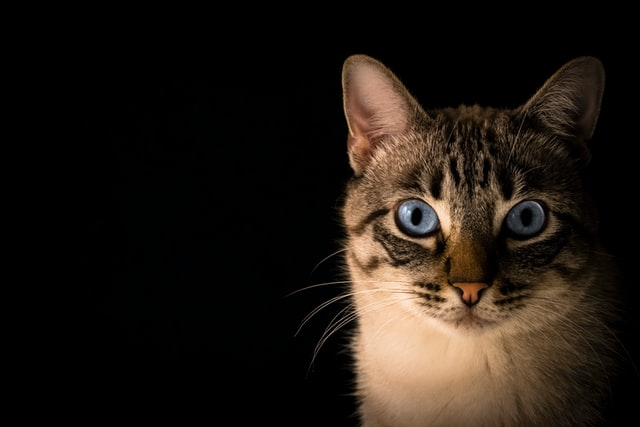

Image shape (height, width, channels): (427, 640, 3)


In [6]:
# Read and display an image
# Note: In Colab, use cv2_imshow instead of cv.imshow
from google.colab.patches import cv2_imshow

# Upload your image file first, then:
img = cv.imread('Resources/Photos/cat.jpg')

# Display image
cv2_imshow(img)

# Check image dimensions
print(f'Image shape (height, width, channels): {img.shape}')

---
## 2. Reading Videos

**What it is:** Reading video files frame-by-frame or accessing webcam/camera feed.

### Key Points:
- `VideoCapture(0)` = webcam, `VideoCapture(1)` = first external camera
- `capture.read()` returns `(isTrue, frame)` - boolean and frame data
- Always check `isTrue` before processing frames
- Always call `release()` and `destroyAllWindows()` when done

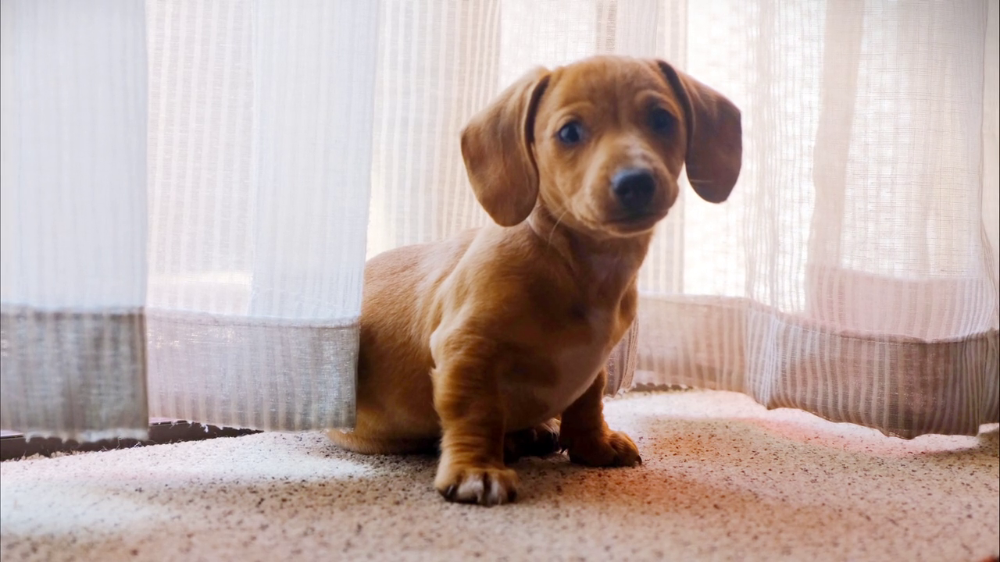

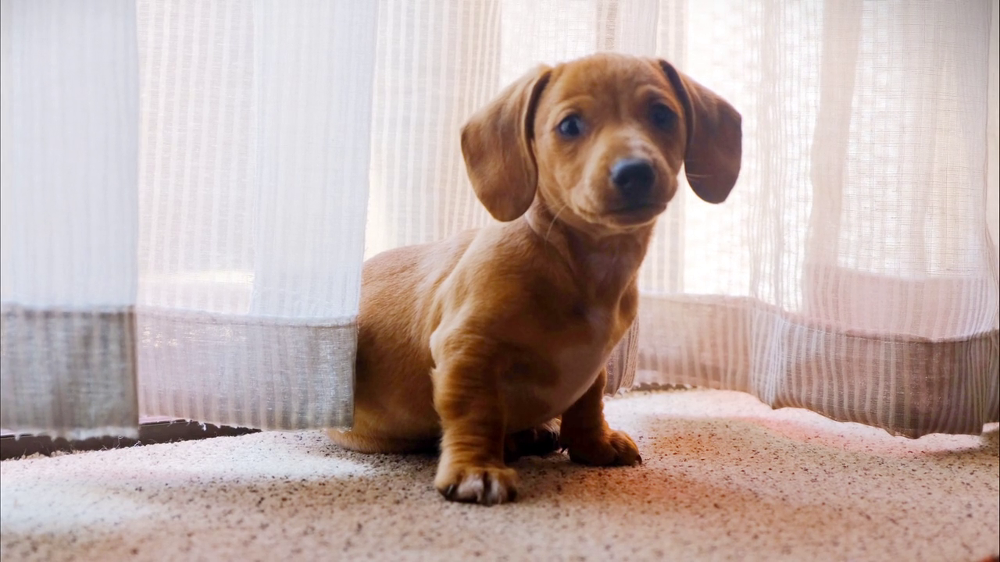

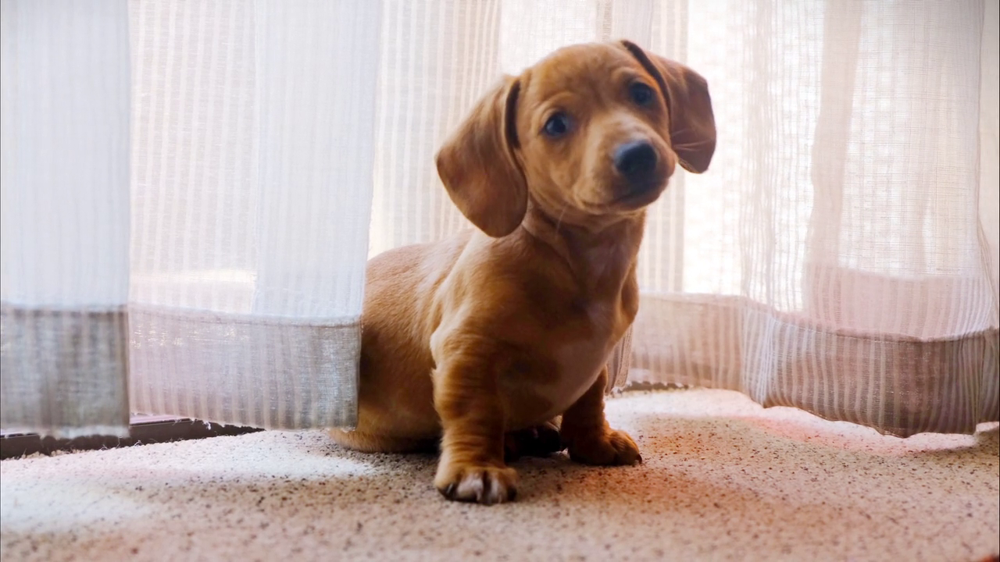

Processed 91 frames


In [8]:
# Reading video from file
capture = cv.VideoCapture('Resources/Videos/dog.mp4')

frame_count = 0
while True:
    isTrue, frame = capture.read()

    if isTrue:
        frame_count += 1
        # Display every 30th frame (to avoid too many outputs)
        if frame_count % 30 == 0:
            cv2_imshow(frame)

        # In Colab, you might want to limit frames
        if frame_count > 90:  # Show only 3 frames
            break
    else:
        break

capture.release()
print(f'Processed {frame_count} frames')

---
## 3. Resizing and Rescaling

**What it is:** Modifying dimensions to reduce computational strain.

### Why resize?
- Large media files require significant processing power
- Prevents images from going off-screen

### Key Points:
- `frame.shape[0]` = height, `frame.shape[1]` = width
- `rescale_frame()` works for images, videos, and live video
- `change_res()` only works for live video (webcam), NOT video files
- Always downscale rather than upscale

Original size: (427, 640, 3)
Resized size: (213, 320, 3)


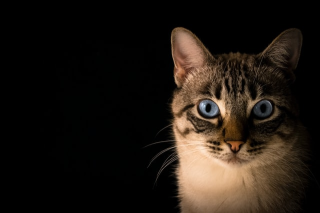

In [9]:
# Rescaling function (works for images, videos, live video)
def rescale_frame(frame, scale=0.75):
    width = int(frame.shape[1] * scale)
    height = int(frame.shape[0] * scale)
    dimensions = (width, height)
    return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)

# Example usage
img = cv.imread('Resources/Photos/cat.jpg')
resized_img = rescale_frame(img, scale=0.5)  # 50% of original

print(f'Original size: {img.shape}')
print(f'Resized size: {resized_img.shape}')

cv2_imshow(resized_img)

---
## 4. Color Space Conversion

**What it is:** Converting images between different color representations.

### Key Points:
- OpenCV uses **BGR (Blue-Green-Red)** format, not RGB
- Grayscale shows intensity distribution only, no color
- Common conversions: BGR↔GRAY, BGR↔RGB, BGR↔HSV

Original image (BGR):


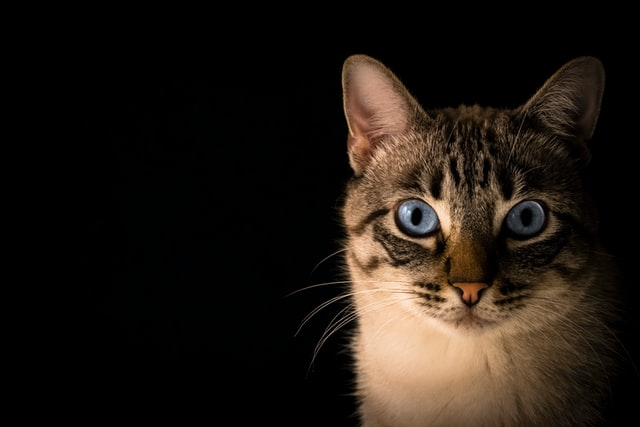


Grayscale image:


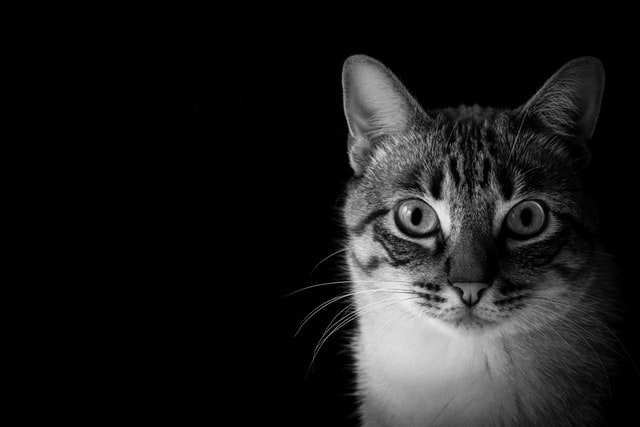

In [10]:
# Converting to grayscale
img = cv.imread('Resources/Photos/cat.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

print('Original image (BGR):')
cv2_imshow(img)

print('\nGrayscale image:')
cv2_imshow(gray)

# Other conversions
rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

---
## 5. Blurring (Gaussian Blur)

**What it is:** Smoothing an image to reduce noise.

### How it works:
- Applies a Gaussian kernel that averages pixel values with neighbors

### Key Points:
- **Kernel size MUST be odd numbers** (3, 5, 7, 9...)
- Larger kernel = more blur
- Use before edge detection to reduce noise

Original:


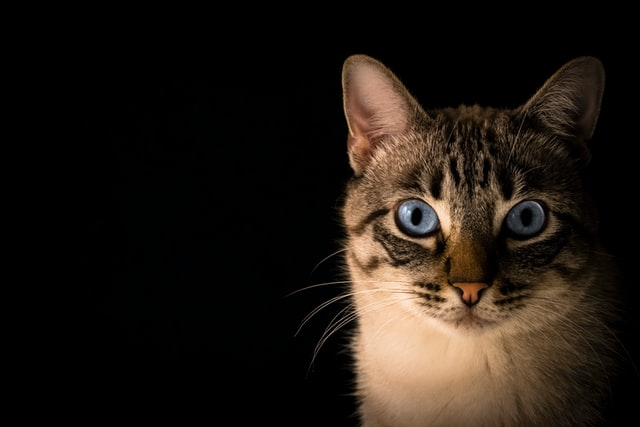


Slight Blur (3x3):


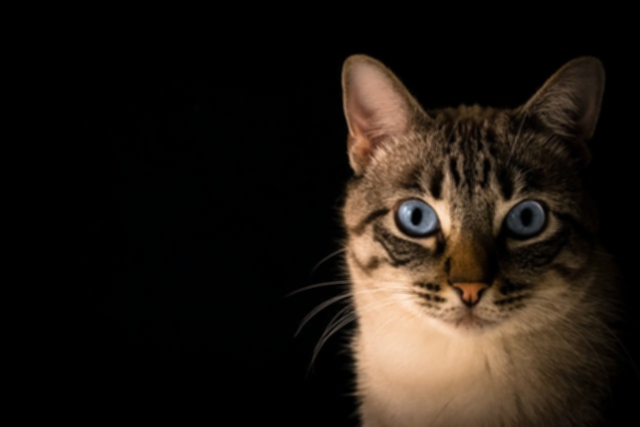


Medium Blur (7x7):


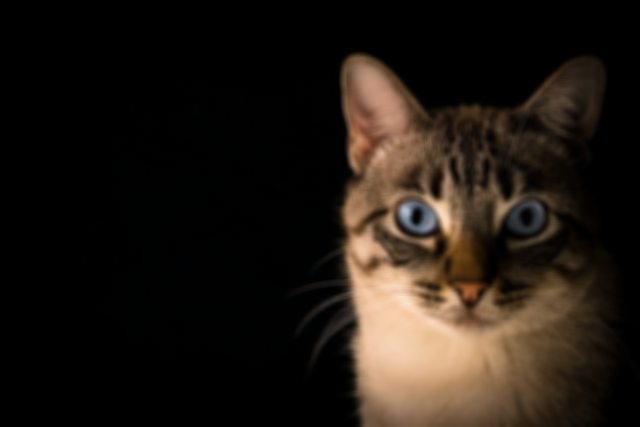


Heavy Blur (15x15):


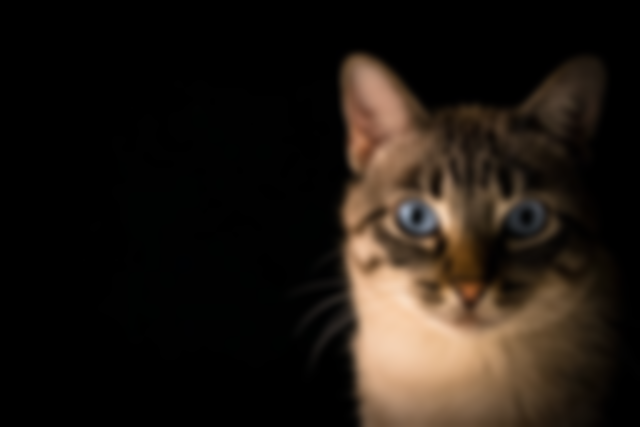

In [14]:
# Gaussian Blur
img = cv.imread('Resources/Photos/cat.jpg')

# Different blur levels
blur_slight = cv.GaussianBlur(img, (3,3), cv.BORDER_DEFAULT)
blur_medium = cv.GaussianBlur(img, (7,7), cv.BORDER_DEFAULT)
blur_heavy = cv.GaussianBlur(img, (15,15), cv.BORDER_DEFAULT)

print('Original:')
cv2_imshow(img)
print('\nSlight Blur (3x3):')
cv2_imshow(blur_slight)
print('\nMedium Blur (7x7):')
cv2_imshow(blur_medium)
print('\nHeavy Blur (15x15):')
cv2_imshow(blur_heavy)

---
## 6. Edge Detection (Canny)

**What it is:** Identifies edges where there are sharp brightness changes.

### Key Points:
- Famous multi-step algorithm in computer vision
- Uses gradient calculations and two thresholds
- Blurring before Canny reduces detected edges
- Returns binary image (black and white)

Original:


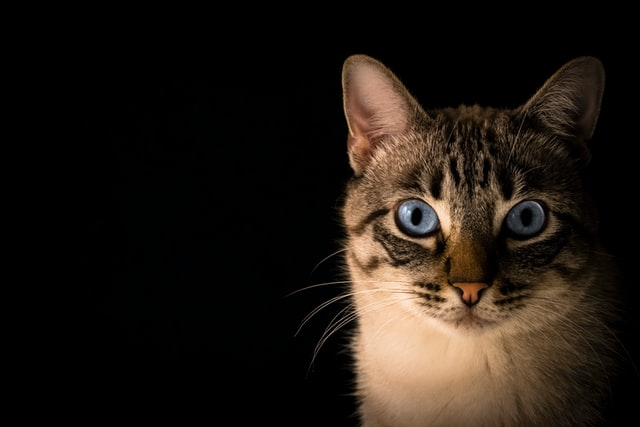


Canny Edges (no blur):


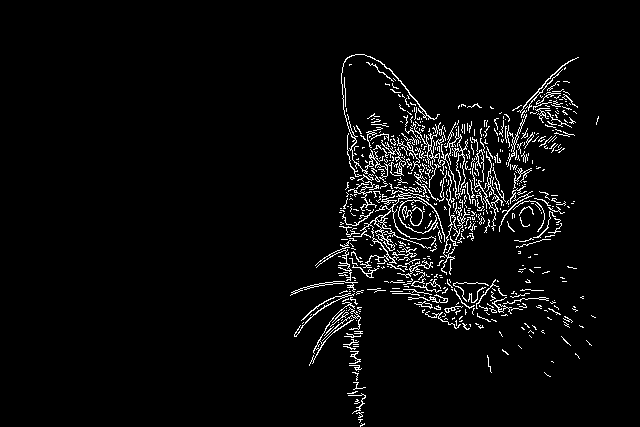


Canny Edges (with blur):


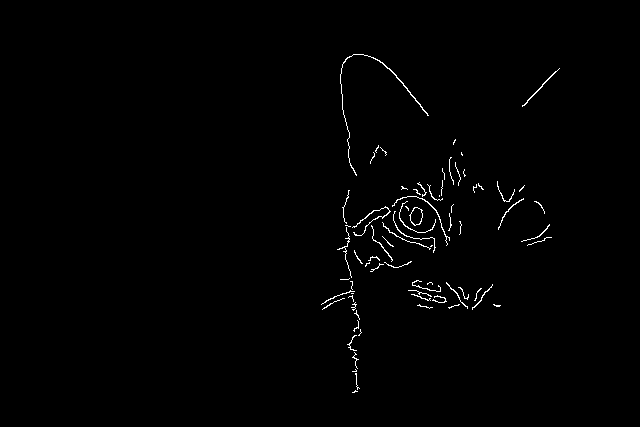

In [15]:
# Canny Edge Detection
img = cv.imread('Resources/Photos/cat.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Edge detection without blur
canny = cv.Canny(gray, 125, 175)

# Edge detection with blur (fewer edges)
blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)
canny_blur = cv.Canny(blur, 125, 175)

print('Original:')
cv2_imshow(img)
print('\nCanny Edges (no blur):')
cv2_imshow(canny)
print('\nCanny Edges (with blur):')
cv2_imshow(canny_blur)

---
## 7. Dilation

**What it is:** Morphological operation that **expands/thickens** white regions.

### Use cases:
- Closing gaps in detected edges
- Making features more prominent
- Joining broken parts
- Increasing edge thickness

### Key Points:
- More iterations = thicker edges
- Larger kernel = more dilation effect

Original Edges:


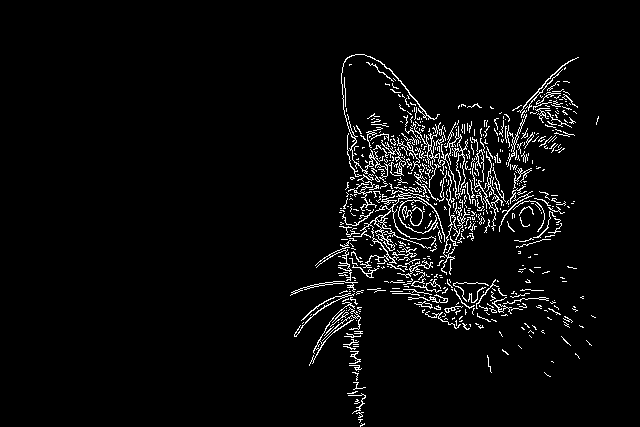


Dilated (1 iteration):


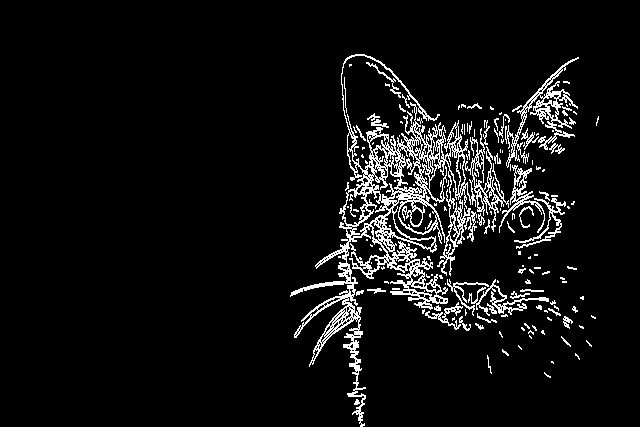


Dilated (3 iterations):


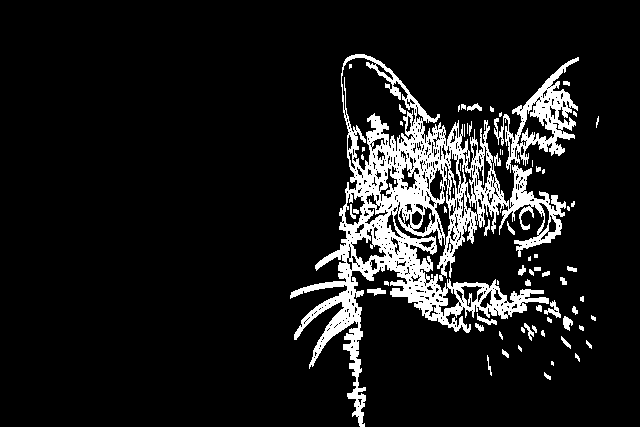


Dilated (5 iterations):


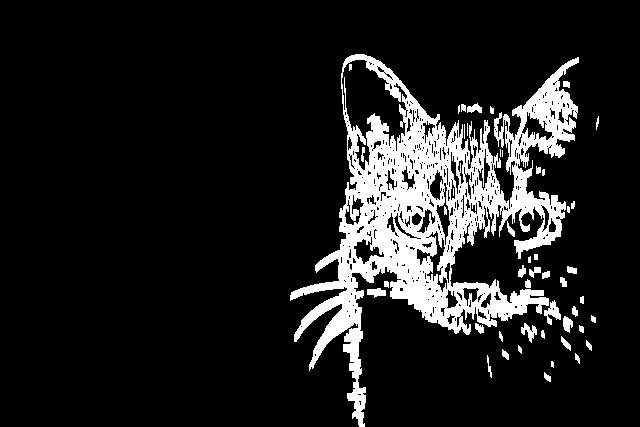

In [16]:
# Dilation
img = cv.imread('Resources/Photos/cat.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
canny = cv.Canny(gray, 125, 175)

# Dilate with different iterations
dilated_1 = cv.dilate(canny, (3,3), iterations=1)
dilated_3 = cv.dilate(canny, (7,7), iterations=3)
dilated_5 = cv.dilate(canny, (7,7), iterations=5)

print('Original Edges:')
cv2_imshow(canny)
print('\nDilated (1 iteration):')
cv2_imshow(dilated_1)
print('\nDilated (3 iterations):')
cv2_imshow(dilated_3)
print('\nDilated (5 iterations):')
cv2_imshow(dilated_5)

---
## 8. Erosion

**What it is:** Morphological operation that **shrinks/thins** white regions. Opposite of dilation.

### Use cases:
- Removing small white noise
- Separating connected objects
- Reducing object size
- **Reversing dilation** (if same kernel and iterations)

### Key Points:
- Can approximately reverse dilation with same parameters

Original Edges:


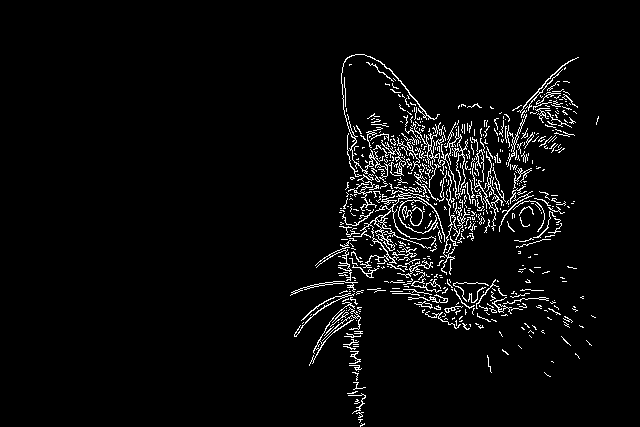


Dilated:


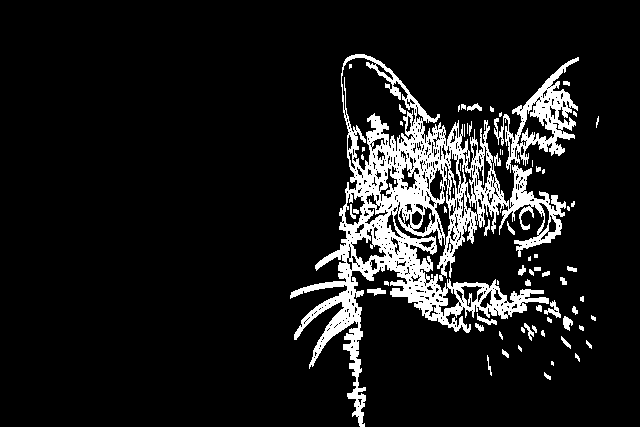


Eroded (back to ~original):


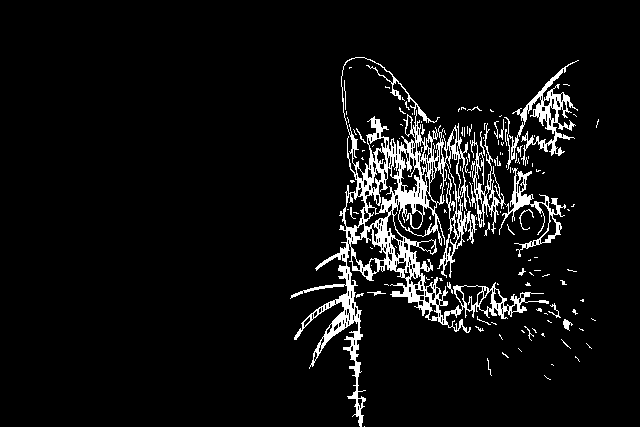

In [18]:
# Erosion - Reversing Dilation
img = cv.imread('Resources/Photos/cat.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
canny = cv.Canny(gray, 125, 175)

# Dilate then erode with same parameters
dilated = cv.dilate(canny, (7,7), iterations=3)
eroded = cv.erode(dilated, (7,7), iterations=3)

print('Original Edges:')
cv2_imshow(canny)
print('\nDilated:')
cv2_imshow(dilated)
print('\nEroded (back to ~original):')
cv2_imshow(eroded)

---
## 9. Resizing

**What it is:** Changing image dimensions to exact width/height.

### Interpolation methods:
- `cv.INTER_AREA` - Best for **shrinking** (default)
- `cv.INTER_LINEAR` - Good for most cases
- `cv.INTER_CUBIC` - Best for **enlarging** (slowest, highest quality)

### Key Points:
- Ignores aspect ratio
- Choose interpolation based on shrinking vs enlarging

Original size: (427, 640, 3)
Resized: (500, 500, 3)

Resized with INTER_AREA:


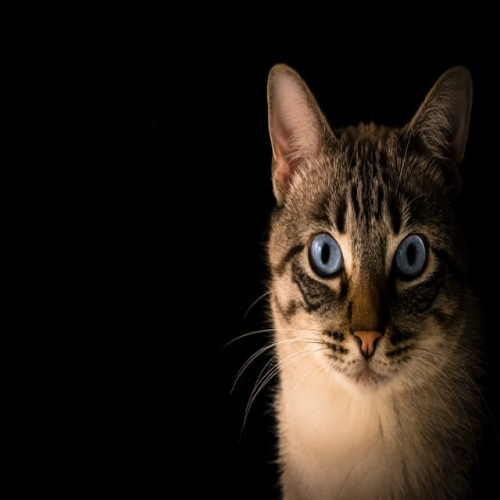


Resized with INTER_CUBIC:


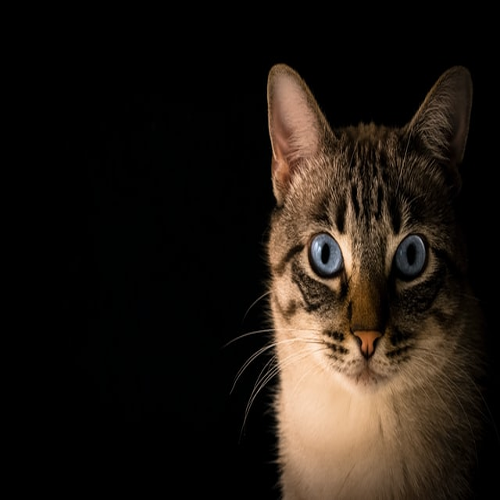

In [19]:
# Resizing with different interpolation methods
img = cv.imread('Resources/Photos/cat.jpg')

# Resize to 500x500
resized_area = cv.resize(img, (500,500), interpolation=cv.INTER_AREA)
resized_cubic = cv.resize(img, (500,500), interpolation=cv.INTER_CUBIC)

print(f'Original size: {img.shape}')
print(f'Resized: (500, 500, 3)')

print('\nResized with INTER_AREA:')
cv2_imshow(resized_area)
print('\nResized with INTER_CUBIC:')
cv2_imshow(resized_cubic)

---
## 10. Cropping

**What it is:** Extracting a rectangular region using **array slicing**.

### Syntax:
```python
cropped = img[start_y:end_y, start_x:end_x]
```

### Key Points:
- Uses Python array slicing
- **Y coordinate (row) comes before X (column)**
- No function needed

Original:


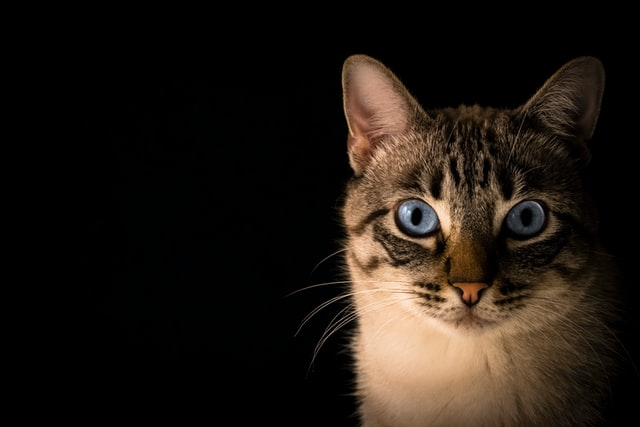


Cropped region:


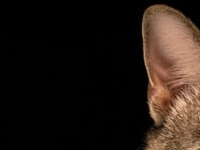

Cropped shape: (150, 200, 3)


In [21]:
# Cropping
img = cv.imread('Resources/Photos/cat.jpg')

# Crop region: rows 50-200, columns 200-400
cropped = img[50:200, 200:400]

print('Original:')
cv2_imshow(img)
print('\nCropped region:')
cv2_imshow(cropped)
print(f'Cropped shape: {cropped.shape}')

---
## 11. Drawing Shapes

**Creating blank images and drawing shapes on them.**

### Key Points:
- Use `np.zeros()` to create blank images
- Color format: BGR (Blue, Green, Red)
- `thickness=-1` or `cv.FILLED` fills shapes

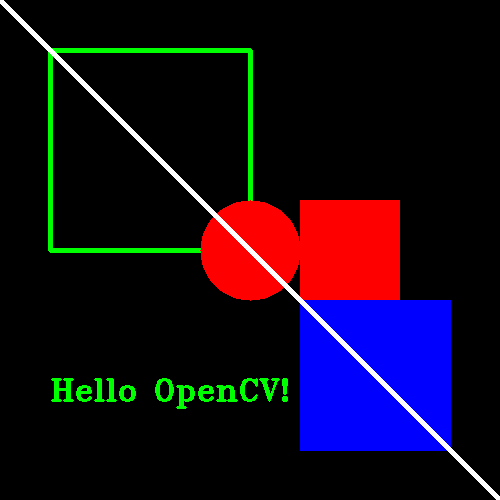

In [23]:
# Create a blank image
blank = np.zeros((500, 500, 3), dtype='uint8')

# Paint a region red
blank[200:300, 300:400] = 0, 0, 255  # BGR: Red

# Draw rectangle
cv.rectangle(blank, (50, 50), (250, 250), (0, 255, 0), thickness=3)

# Draw filled rectangle
cv.rectangle(blank, (300, 300), (450, 450), (255, 0, 0), thickness=-1)

# Draw circle
cv.circle(blank, (250, 250), 50, (0, 0, 255), thickness=-1)

# Draw line
cv.line(blank, (0, 0), (500, 500), (255, 255, 255), thickness=3)

# Write text
cv.putText(blank, 'Hello OpenCV!', (50, 400),
           cv.FONT_HERSHEY_TRIPLEX, 1.0, (0, 255, 0), 2)

cv2_imshow(blank)

---
## 12. Image Transformations

### Translation (Shifting)

**Rules:**
- **Negative X** → Shift **LEFT**
- **Positive X** → Shift **RIGHT**
- **Negative Y** → Shift **UP**
- **Positive Y** → Shift **DOWN**

Original:


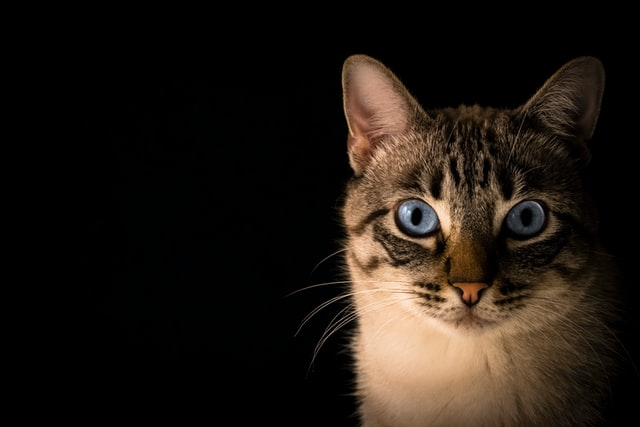


Translated (right 100, down 100):


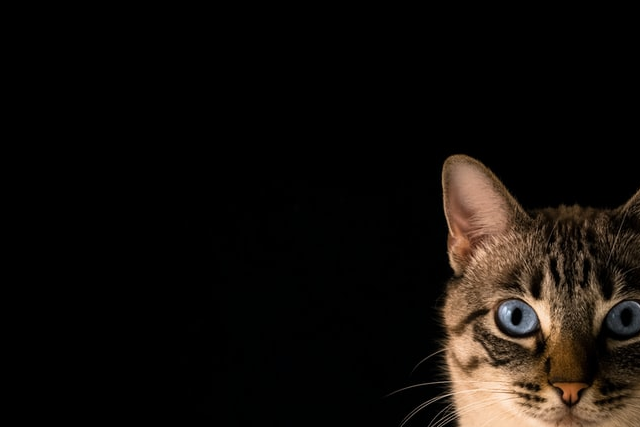

In [24]:
# Translation function
def translate(img, x, y):
    transMat = np.float32([[1, 0, x], [0, 1, y]])
    dimensions = (img.shape[1], img.shape[0])
    return cv.warpAffine(img, transMat, dimensions)

img = cv.imread('Resources/Photos/cat.jpg')

# Shift right 100px down 100px
translated = translate(img, 100, 100)

print('Original:')
cv2_imshow(img)
print('\nTranslated (right 100, down 100):')
cv2_imshow(translated)

### Rotation

**Key Points:**
- Positive angle = **counter-clockwise**
- Negative angle = **clockwise**
- Can rotate around any point (default: center)
- Black triangles appear in empty regions

Rotated 45° CCW:


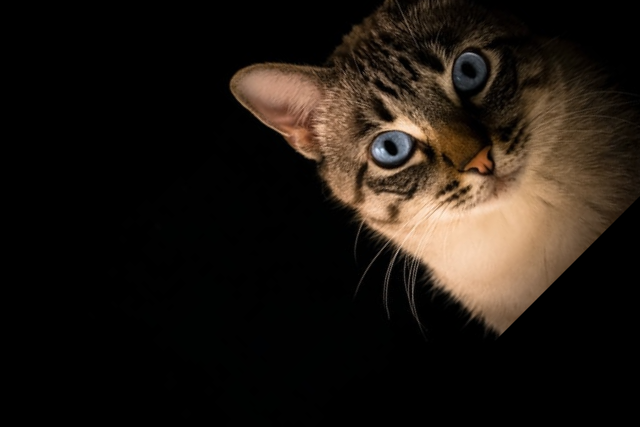


Rotated 45° CW:


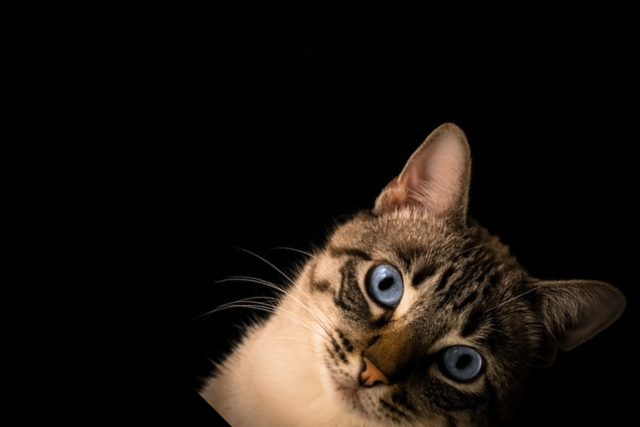

In [25]:
# Rotation function
def rotate(img, angle, rotPoint=None):
    (height, width) = img.shape[:2]  # Added missing comma
    if rotPoint is None:
        rotPoint = (width//2, height//2)

    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width, height)
    return cv.warpAffine(img, rotMat, dimensions)

img = cv.imread('Resources/Photos/cat.jpg')  # Removed extra commas

# Rotate 45° counter-clockwise
rotated_ccw = rotate(img, 45)

# Rotate 45° clockwise
rotated_cw = rotate(img, -45)

print('Rotated 45° CCW:')
cv2_imshow(rotated_ccw)
print('\nRotated 45° CW:')
cv2_imshow(rotated_cw)

### Flipping

**Flip codes:**
- `0` = **Vertical** flip (over X-axis)
- `1` = **Horizontal** flip (over Y-axis)
- `-1` = **Both** vertical and horizontal

Original:


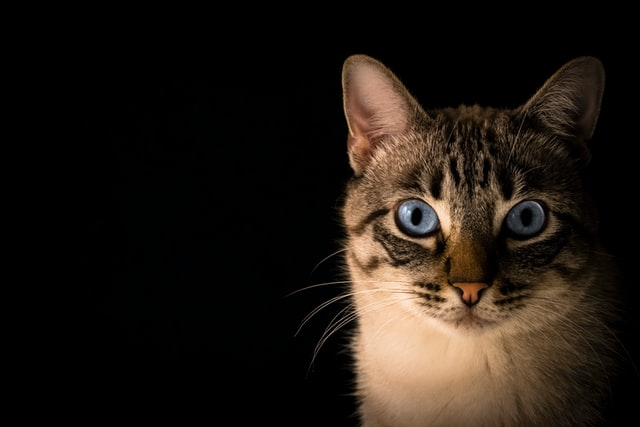


Vertical flip:


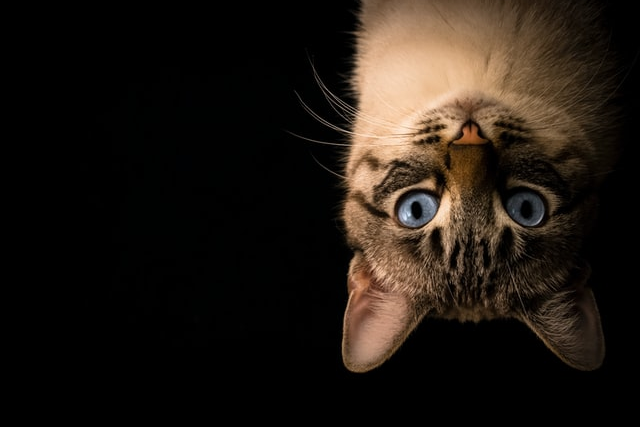


Horizontal flip:


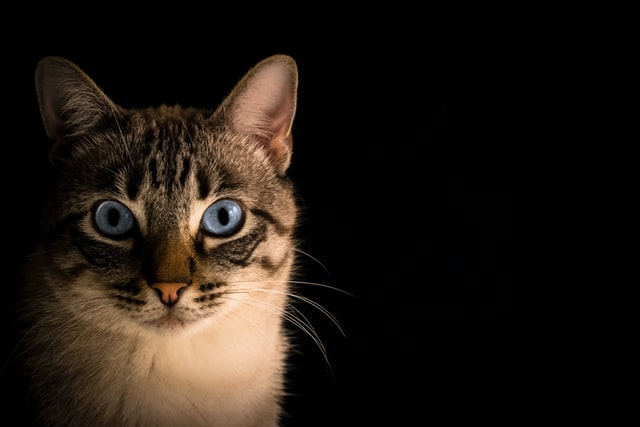


Both flips:


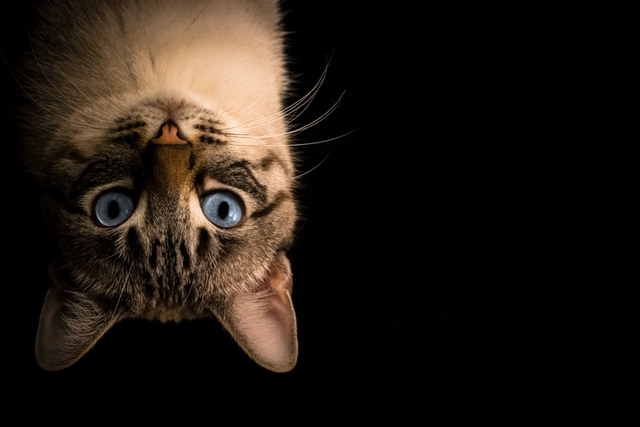

In [26]:
# Flipping
img = cv.imread('Resources/Photos/cat.jpg')

flip_vertical = cv.flip(img, 0)
flip_horizontal = cv.flip(img, 1)
flip_both = cv.flip(img, -1)

print('Original:')
cv2_imshow(img)
print('\nVertical flip:')
cv2_imshow(flip_vertical)
print('\nHorizontal flip:')
cv2_imshow(flip_horizontal)
print('\nBoth flips:')
cv2_imshow(flip_both)

---
## 13. Thresholding

**What it is:** Converting grayscale to **binary** (black/white) based on threshold.

### Simple Thresholding:
- Uses **one value** for entire image
- Pixels < threshold → Black (0)
- Pixels ≥ threshold → White (255)

### Adaptive Thresholding:
- Calculates **different thresholds for different regions**
- Better for varying lighting conditions

Original:


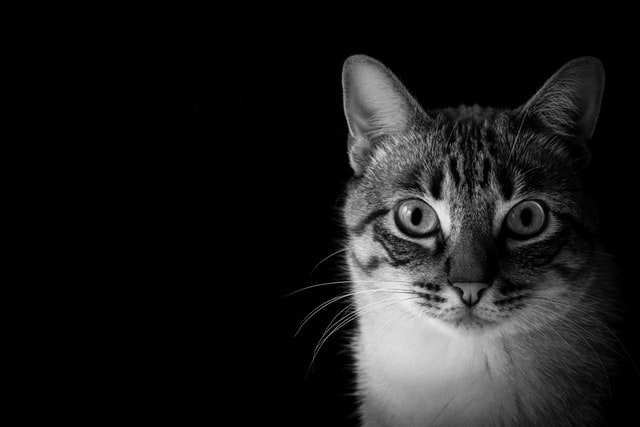


Simple Threshold:


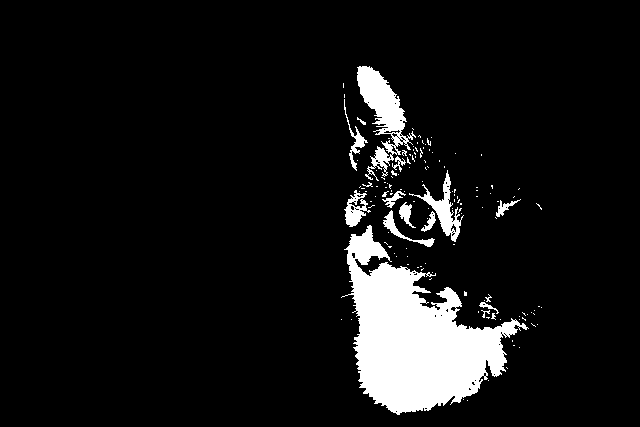


Simple Threshold Inverse:


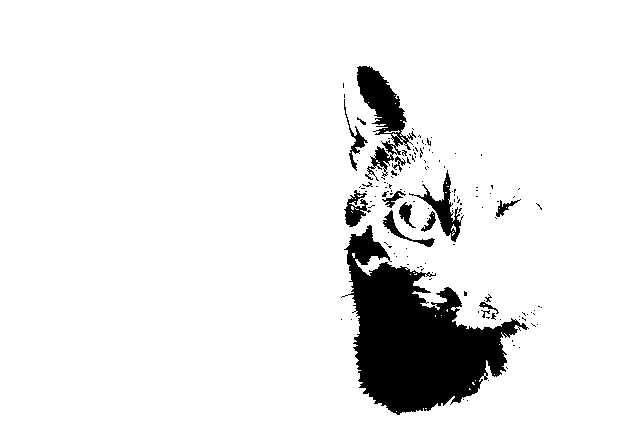


Adaptive Threshold:


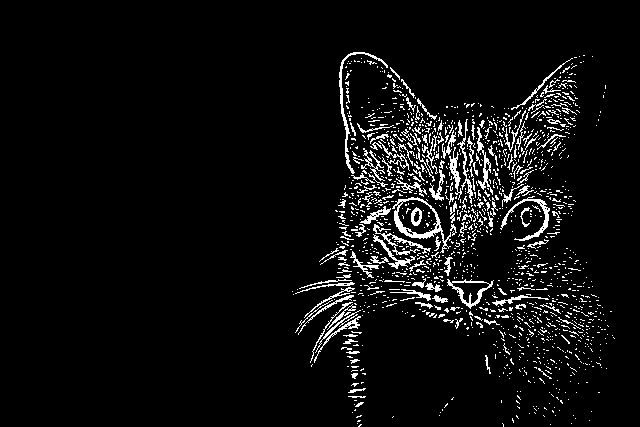

In [27]:
# Simple Thresholding
img = cv.imread('Resources/Photos/cat.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Simple threshold
ret, thresh = cv.threshold(gray, 125, 255, cv.THRESH_BINARY)
ret, thresh_inv = cv.threshold(gray, 125, 255, cv.THRESH_BINARY_INV)

# Adaptive threshold
adaptive = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C,
                                cv.THRESH_BINARY_INV, 11, 9)

print('Original:')
cv2_imshow(gray)
print('\nSimple Threshold:')
cv2_imshow(thresh)
print('\nSimple Threshold Inverse:')
cv2_imshow(thresh_inv)
print('\nAdaptive Threshold:')
cv2_imshow(adaptive)

---
## 14. Contours

**What it is:** Curves joining continuous points along object boundaries.

### Use cases:
- Shape analysis
- Object detection and recognition
- Finding boundaries

### Retrieval Modes:
- `cv.RETR_LIST` - All contours (no hierarchy)
- `cv.RETR_EXTERNAL` - Only outer contours
- `cv.RETR_TREE` - All hierarchical contours

### Approximation Methods:
- `cv.CHAIN_APPROX_NONE` - All points
- `cv.CHAIN_APPROX_SIMPLE` - Compressed (essential points only)

74 contour(s) found!

Original:


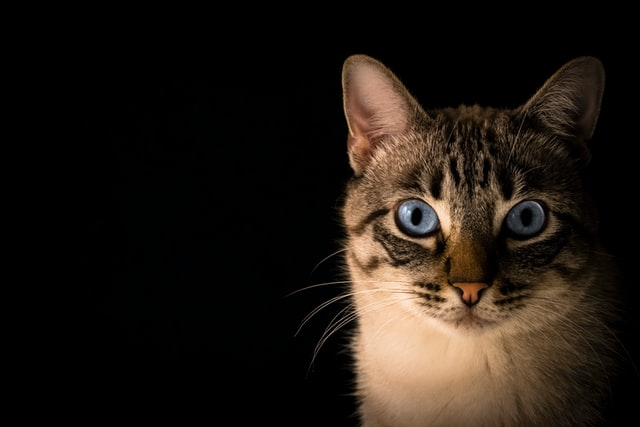


Canny Edges:


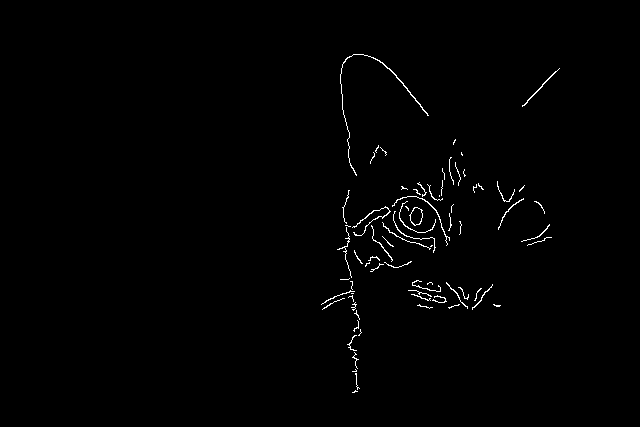


Contours Drawn:


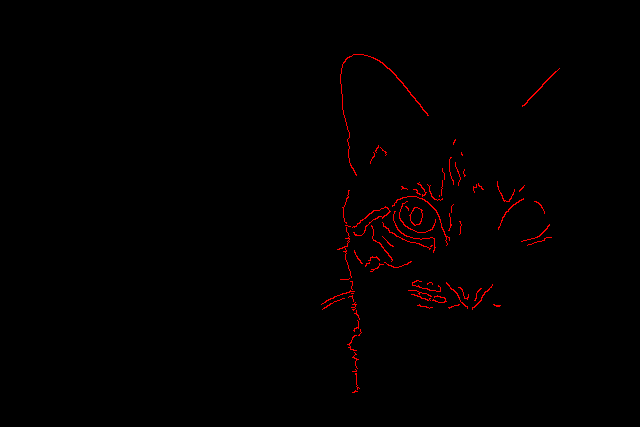

In [28]:
# Finding and Drawing Contours
img = cv.imread('Resources/Photos/cat.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Method 1: Using Canny (Recommended)
blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)
canny = cv.Canny(blur, 125, 175)

# Find contours
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST,
                                         cv.CHAIN_APPROX_SIMPLE)

print(f'{len(contours)} contour(s) found!')

# Draw contours on blank image
blank = np.zeros(img.shape, dtype='uint8')
cv.drawContours(blank, contours, -1, (0, 0, 255), 1)

print('\nOriginal:')
cv2_imshow(img)
print('\nCanny Edges:')
cv2_imshow(canny)
print('\nContours Drawn:')
cv2_imshow(blank)

---
## 🎯 Important Reminders

1. **Color Format:** OpenCV uses **BGR**, not RGB
2. **Coordinate Order:** `img[y, x]` or `img[row, column]` - **Y comes first!**
3. **Image Shape:**
   - `img.shape[0]` = height
   - `img.shape[1]` = width
   - `img.shape[2]` = channels (usually 3 for BGR)
4. **Kernel Sizes:** Must be **odd numbers** (3, 5, 7, 9, 11...)
5. **Data Type:** Images use `dtype='uint8'` (0-255 range)
6. **Colab Specific:** Use `cv2_imshow()` instead of `cv.imshow()` and `cv.waitKey()`

---
## ⚠️ Common Errors

- **Negative 215 Assertion Failed** → File not found at specified path
  - Wrong file path
  - Video runs out of frames
  - Trying to read non-existent data

---

## 📚 Resources

- [OpenCV Documentation](https://docs.opencv.org/)
- [OpenCV Python Tutorial](https://docs.opencv.org/master/d6/d00/tutorial_py_root.html)

---

**✅ You now have all the OpenCV basics needed for image and video handling! Good luck with your project! 🚀**